__Kaggle__

https://www.kaggle.com/mlg-ulb/creditcardfraud

__Detecting Financial Fraud Using Machine Learning: Winning the War Against Imbalanced Data__

https://towardsdatascience.com/detecting-financial-fraud-using-machine-learning-three-ways-of-winning-the-war-against-imbalanced-a03f8815cce9

## Import Libraries

In [172]:
# Manage Data
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Machine Learning
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.ensemble import RandomForestClassifier

# Metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import auc
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import plot_roc_curve
from sklearn.metrics import precision_score, recall_score

## Import Data

In [2]:
%%time

# Load data
dataset = pd.read_csv('creditcard.csv')

# Print Shape
print('Dataset shape', dataset.shape)

Dataset shape (284807, 31)
Wall time: 1.76 s


In [3]:
dataset.head(20)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
5,2.0,-0.425966,0.960523,1.141109,-0.168252,0.420987,-0.029728,0.476201,0.260314,-0.568671,...,-0.208254,-0.559825,-0.026398,-0.371427,-0.232794,0.105915,0.253844,0.081080,3.67,0
6,4.0,1.229658,0.141004,0.045371,1.202613,0.191881,0.272708,-0.005159,0.081213,0.464960,...,-0.167716,-0.270710,-0.154104,-0.780055,0.750137,-0.257237,0.034507,0.005168,4.99,0
7,7.0,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
8,7.0,-0.894286,0.286157,-0.113192,-0.271526,2.669599,3.721818,0.370145,0.851084,-0.392048,...,-0.073425,-0.268092,-0.204233,1.011592,0.373205,-0.384157,0.011747,0.142404,93.20,0
9,9.0,-0.338262,1.119593,1.044367,-0.222187,0.499361,-0.246761,0.651583,0.069539,-0.736727,...,-0.246914,-0.633753,-0.120794,-0.385050,-0.069733,0.094199,0.246219,0.083076,3.68,0


In [4]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [5]:
dataset.isnull().values.any()

False

In [6]:
dataset[['Time', 'Amount', 'Class']].describe()

,Time,Amount,Class
count,284807.000000,284807.000000,284807.000000
mean,94813.859575,88.349619,0.001727
std,47488.145955,250.120109,0.041527
min,0.000000,0.000000,0.000000
25%,54201.500000,5.600000,0.000000
50%,84692.000000,22.000000,0.000000
75%,139320.500000,77.165000,0.000000
max,172792.000000,25691.160000,1.000000


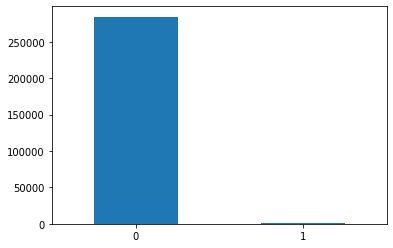

In [7]:
dataClasses = pd.value_counts(dataset['Class'])

dataClasses.plot(kind='bar', rot=0)

With this plot it is easy to confirm what we already suspected, the dataset is higly imbalanced.

In [8]:
dataClasses.value_counts([dataset['Class'] > 0])

284315    0.5
492       0.5
Name: Class, dtype: float64

In [9]:
fraud = dataset[dataset['Class'] == 1]
valid = dataset[dataset['Class'] == 0]

In [10]:
fraud.Amount.describe()

count     492.000000
mean      122.211321
std       256.683288
min         0.000000
25%         1.000000
50%         9.250000
75%       105.890000
max      2125.870000
Name: Amount, dtype: float64

In [11]:
valid.Amount.describe()

count    284315.000000
mean         88.291022
std         250.105092
min           0.000000
25%           5.650000
50%          22.000000
75%          77.050000
max       25691.160000
Name: Amount, dtype: float64

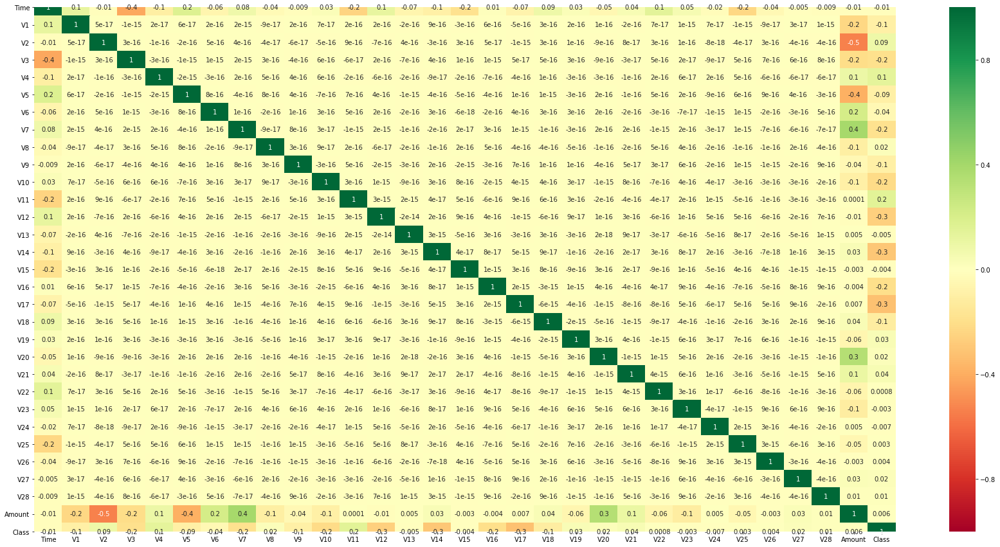

In [12]:
corr = dataset.corr(method='pearson')

figure = plt.figure(figsize=(30,15))
sns.heatmap(corr, annot=True, fmt = '.1g', vmin = -1, vmax = 1, center = 0, cmap="RdYlGn")
plt.show()

C:\Users\pedro\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\pedro\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


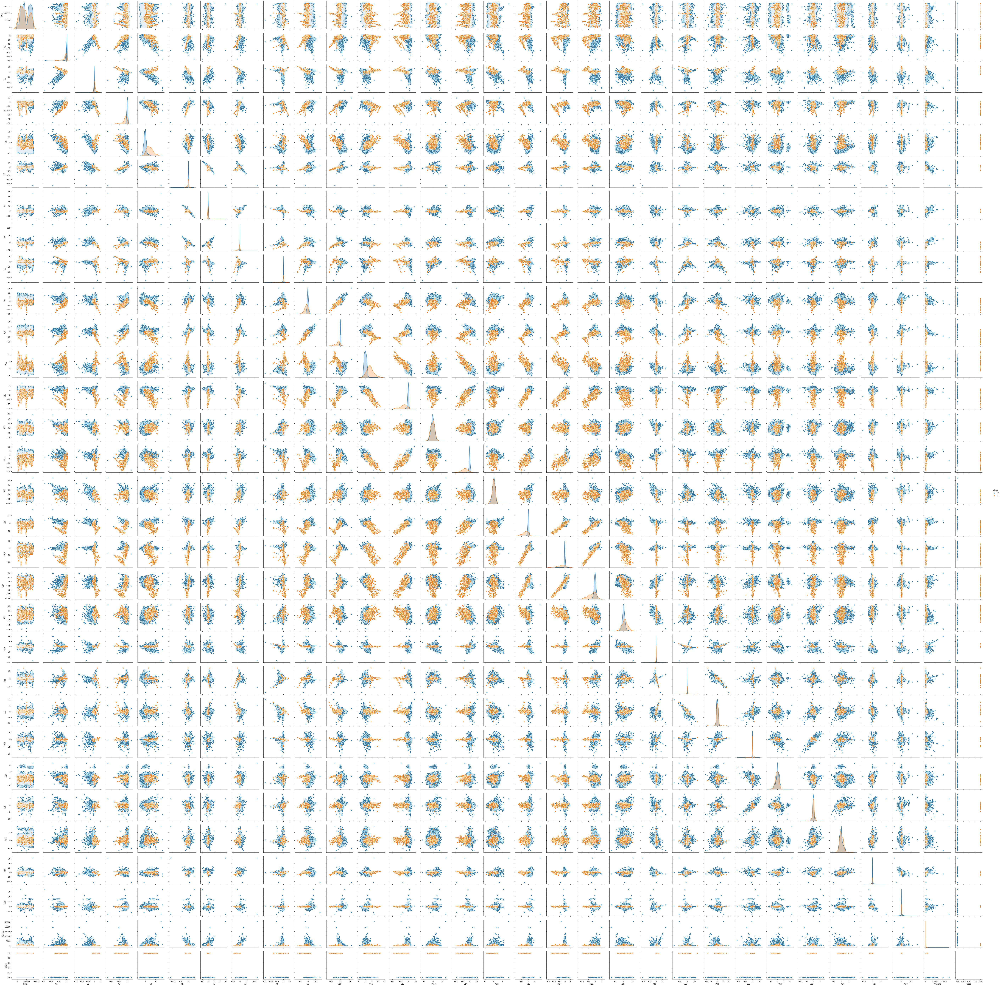

In [17]:
sns.pairplot(dataset, hue='Class')

# Handle Imbalance Data

To deal with imbalance data we can have 3 approachs:
- Oversampling — SMOTE
- Undersampling — RandomUnderSampler
- Combined Class Methods — SMOTE + ENN

## Prepare Data to Feed the Model

In [119]:
X = dataset.drop(['Class'], axis=1) # Exclude the Class column
X = np.array(X) # Transform the dataset into an array

y = dataset[['Class']] # Select only the Class column
y = np.array(y) # Transform the dataset into an array

In [125]:
SSS = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

In [135]:
# Split data into train and test with Stratified Shuffle Split

for train_index, test_index in SSS.split(X, y):
    Xtrain, Xtest = X[train_index], X[test_index]
    Ytrain, Ytest = y[train_index], y[test_index]

## Random Forest Classifier

In [136]:
RFclassifier = RandomForestClassifier()

In [138]:
RFclassifier.fit(Xtrain, Ytrain)

C:\Users\pedro\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  """Entry point for launching an IPython kernel.


RandomForestClassifier()

In [166]:
# Compute class predictions

RFpred = RFclassifier.predict(Xtest)

## Model Evaluation

In [167]:
# Calculating FPR, TPR and Tresholds

rf_fpr, rf_tpr, thresholds = roc_curve(Ytest, RFpred)

In [168]:
# Calculating AUC Score

rf_auroc = roc_auc_score(Ytest, RFpred)
print('Random Forest AUROC: {}' .format(rf_auroc))

Random Forest AUROC: 0.9132213415754596


In [169]:
# Baseline, 0, the worst case scenario

random = [0 for _ in range(len(Ytest))]

random_auc = roc_auc_score(Ytest, random)
random_fpr, random_tpr, thresholds = roc_curve(Ytest, random)

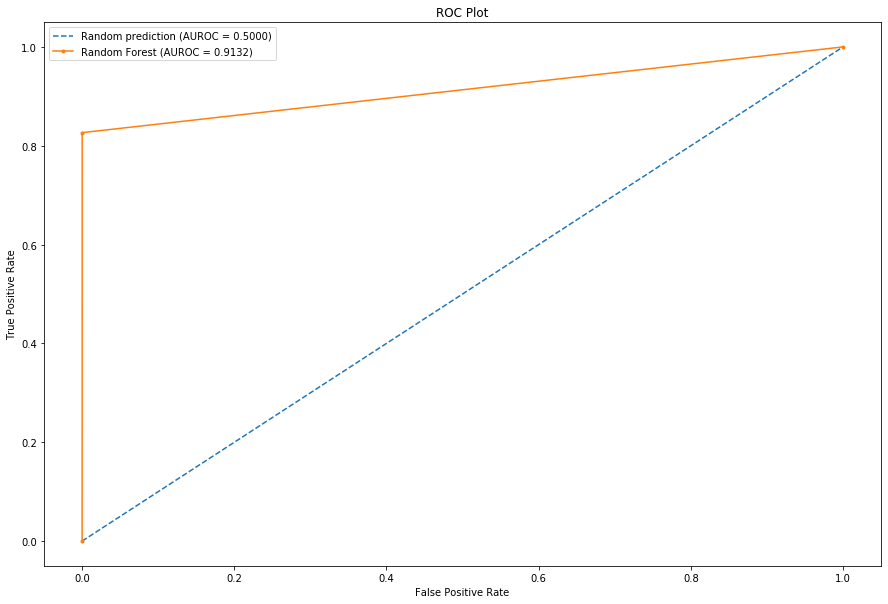

In [170]:
# Ploting the ROC Curve

figure = plt.figure(figsize=(15,10))
plt.plot(random_fpr, random_tpr, linestyle='--', label='Random prediction (AUROC = %0.4f)' % random_auc)
plt.plot(rf_fpr, rf_tpr, marker='.', label='Random Forest (AUROC = %0.4f)' % rf_auroc)

plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

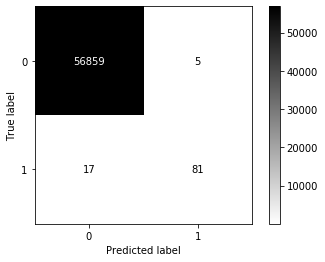

In [165]:
# Plot Confusion Matrix

plot_confusion_matrix(RFclassifier, Xtest, Ytest, cmap='binary')

In [183]:
precision = precision_score(Ytest, RFpred)
recall = recall_score(Ytest, RFpred)

print('Precision: {}' .format(precision)) # The ratio of positive (frauds) predictions that were precise 
print('Recall: {}' .format(recall)) # The ratio of positive instances (frauds) correctly classified by the model

Precision: 0.9418604651162791
Recall: 0.826530612244898


## Results

- 94% of the positive predictions were correctly classified.
- 82% of the fraudlent transactions were correctly classified.

There is a trade-off between Precision and Recall:
- To get better Precision, we should rise the treshold. However, more fraudlent transactions wouldn't be detected.
- On the other hand, if we lower the treshold we would have more clients being wrongly notified.